In [31]:
import os
import cv2
import numpy
from tqdm.notebook import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as tt
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torchvision.utils import make_grid,save_image
import matplotlib.pyplot as plt
%matplotlib inline

In [32]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [33]:
DIR = '/content/drive/MyDrive/Colab Notebooks/dataset/real'
os.listdir(DIR)

['human']

['human']

In [34]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
train_ds = ImageFolder(DIR,transform = tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.RandomHorizontalFlip(p=0.5),
    tt.ToTensor(),
    tt.Normalize(*stats)
]))
train_dl = DataLoader(train_ds,batch_size,shuffle = True,num_workers = 3, pin_memory = True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [35]:
def denorm(img_tensor):
    return img_tensor*stats[1][0] + stats[0][0]

In [36]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


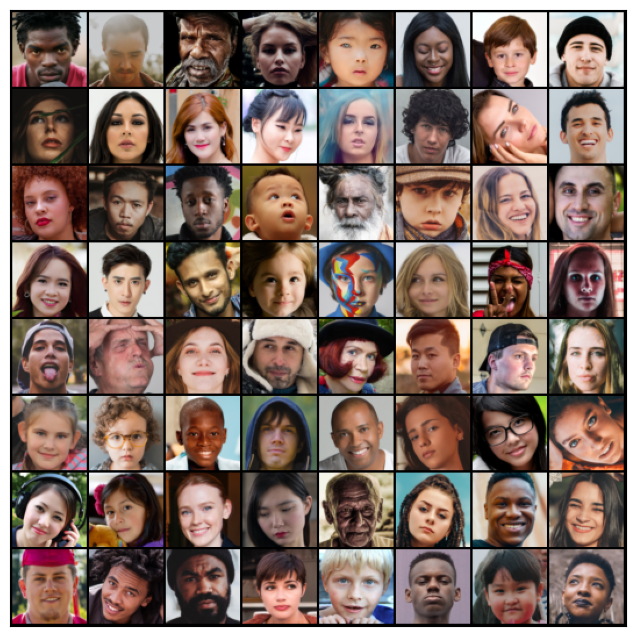

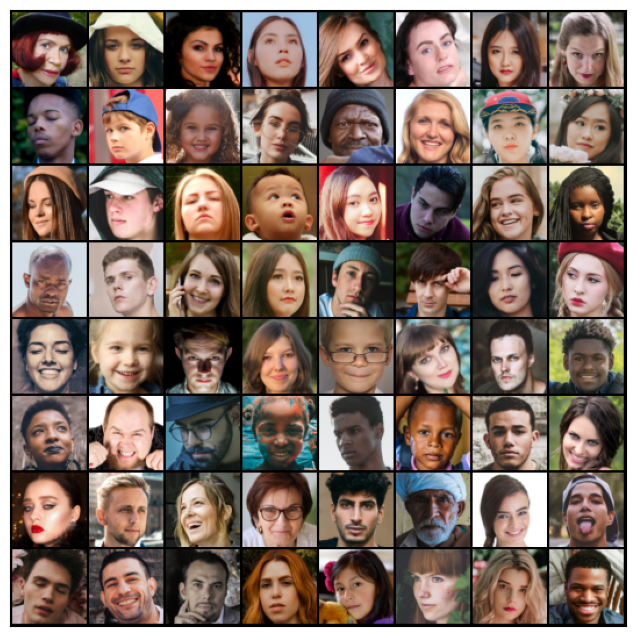

In [37]:
show_batch(train_dl)

In [38]:
def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data,device):
    if isinstance(data,(list,tuple)):
        return [to_device(x,device) for x in data]
    return data.to(device, non_blocking = True)

class DeviceDataLoader():
    def __init__(self,dl,device):
        self.dl = dl
        self.device = device
    def __iter__(self):
        for b in self.dl:
            yield to_device(b,device)
    def __len__(self):
        return len(self.dl)

In [39]:
device = get_default_device()
device

device(type='cpu')

device(type='cpu')

In [40]:
train_dl = DeviceDataLoader(train_dl,device)

In [41]:
discriminator = nn.Sequential(

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),

    nn.Flatten(),
    nn.Sigmoid())

In [42]:
discriminator = to_device(discriminator,device)

In [43]:
latent_size = 128
generator = nn.Sequential(

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
)

torch.Size([128, 3, 64, 64])


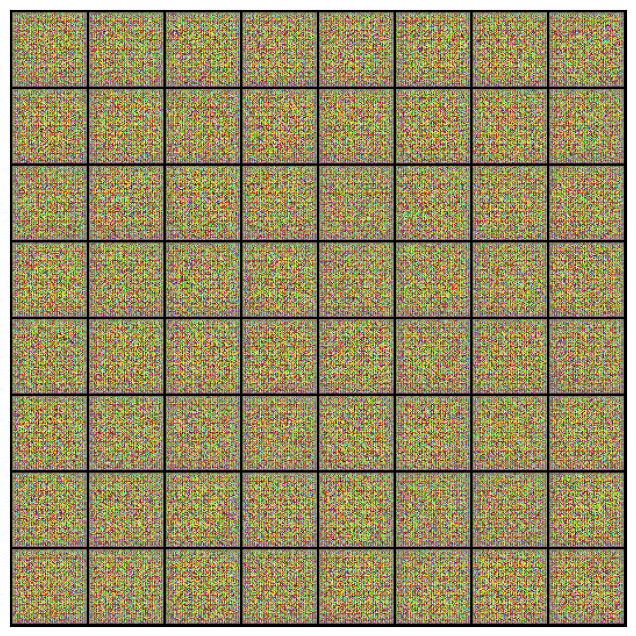

torch.Size([128, 3, 64, 64])


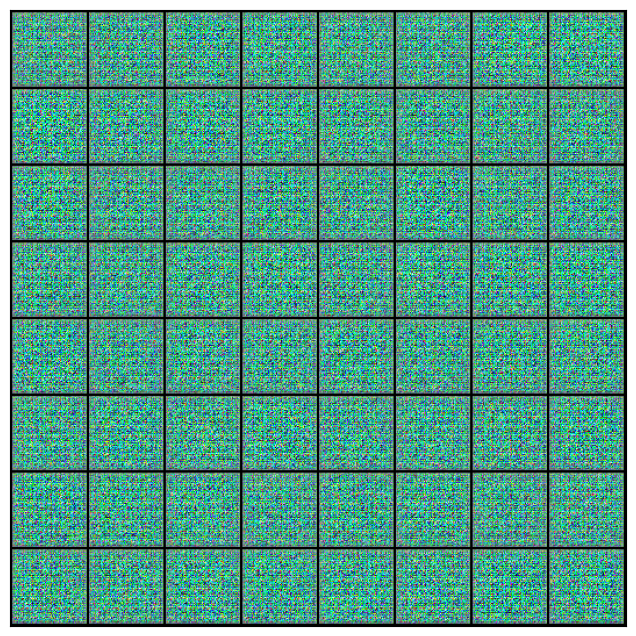

In [44]:
xb = torch.randn(batch_size,latent_size,1,1)
fake_image = generator(xb)
print(fake_image.shape)
show_images(fake_image)

In [45]:
generator = to_device(generator, device)

In [46]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [47]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [48]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [49]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    print(fake_images.size())
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [50]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)
fixed_latent.shape

torch.Size([64, 128, 1, 1])

torch.Size([64, 128, 1, 1])

torch.Size([64, 3, 64, 64])
Saving generated-images-0000.png


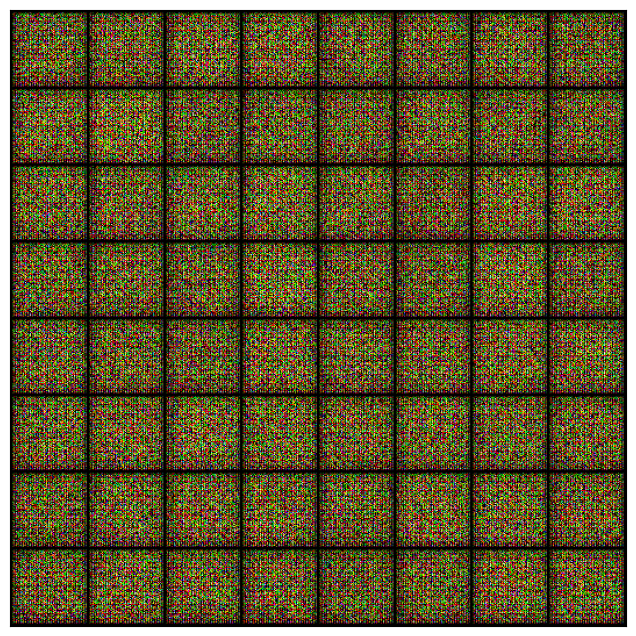

torch.Size([64, 3, 64, 64])
Saving generated-images-0000.png


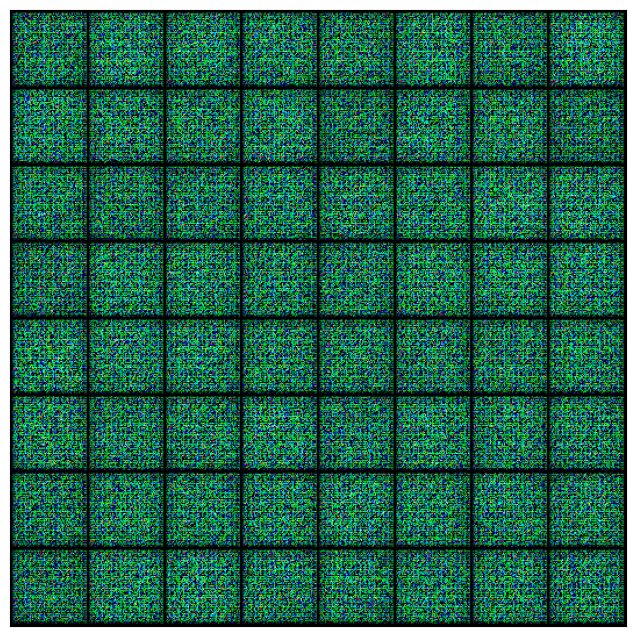

In [51]:
save_samples(0, fixed_latent)

In [52]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [53]:
lr = 0.0002
epochs = 60

In [25]:
history = fit(epochs, lr)

  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [1/60], loss_g: 6.9674, loss_d: 0.5462, real_score: 0.8437, fake_score: 0.2649
torch.Size([64, 3, 64, 64])
Saving generated-images-0001.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [2/60], loss_g: 9.9236, loss_d: 0.1448, real_score: 0.8891, fake_score: 0.0025
torch.Size([64, 3, 64, 64])
Saving generated-images-0002.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [3/60], loss_g: 13.7636, loss_d: 0.1851, real_score: 0.8474, fake_score: 0.0000
torch.Size([64, 3, 64, 64])
Saving generated-images-0003.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [4/60], loss_g: 13.8892, loss_d: 0.3558, real_score: 0.7844, fake_score: 0.0000
torch.Size([64, 3, 64, 64])
Saving generated-images-0004.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [5/60], loss_g: 7.8132, loss_d: 0.1121, real_score: 0.9222, fake_score: 0.0005
torch.Size([64, 3, 64, 64])
Saving generated-images-0005.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [6/60], loss_g: 11.0374, loss_d: 0.5591, real_score: 0.9189, fake_score: 0.3621
torch.Size([64, 3, 64, 64])
Saving generated-images-0006.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [7/60], loss_g: 14.1098, loss_d: 2.0082, real_score: 0.9504, fake_score: 0.8441
torch.Size([64, 3, 64, 64])
Saving generated-images-0007.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [8/60], loss_g: 11.9343, loss_d: 0.0735, real_score: 0.9325, fake_score: 0.0004
torch.Size([64, 3, 64, 64])
Saving generated-images-0008.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [9/60], loss_g: 9.6549, loss_d: 0.1828, real_score: 0.8590, fake_score: 0.0020
torch.Size([64, 3, 64, 64])
Saving generated-images-0009.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [10/60], loss_g: 7.0466, loss_d: 0.0522, real_score: 0.9792, fake_score: 0.0299
torch.Size([64, 3, 64, 64])
Saving generated-images-0010.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [11/60], loss_g: 6.2115, loss_d: 0.1952, real_score: 0.8938, fake_score: 0.0646
torch.Size([64, 3, 64, 64])
Saving generated-images-0011.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [12/60], loss_g: 6.2480, loss_d: 0.1118, real_score: 0.9463, fake_score: 0.0462
torch.Size([64, 3, 64, 64])
Saving generated-images-0012.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [13/60], loss_g: 6.4400, loss_d: 0.1091, real_score: 0.9508, fake_score: 0.0536
torch.Size([64, 3, 64, 64])
Saving generated-images-0013.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [14/60], loss_g: 9.3571, loss_d: 1.3424, real_score: 0.4215, fake_score: 0.0001
torch.Size([64, 3, 64, 64])
Saving generated-images-0014.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [15/60], loss_g: 0.7528, loss_d: 0.8798, real_score: 0.5567, fake_score: 0.0832
torch.Size([64, 3, 64, 64])
Saving generated-images-0015.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [16/60], loss_g: 2.6856, loss_d: 0.5993, real_score: 0.7278, fake_score: 0.1762
torch.Size([64, 3, 64, 64])
Saving generated-images-0016.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [17/60], loss_g: 3.6622, loss_d: 2.5463, real_score: 0.1743, fake_score: 0.0050
torch.Size([64, 3, 64, 64])
Saving generated-images-0017.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [18/60], loss_g: 2.7530, loss_d: 0.6164, real_score: 0.7135, fake_score: 0.1915
torch.Size([64, 3, 64, 64])
Saving generated-images-0018.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [19/60], loss_g: 2.5312, loss_d: 0.4483, real_score: 0.7936, fake_score: 0.1632
torch.Size([64, 3, 64, 64])
Saving generated-images-0019.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [20/60], loss_g: 5.8626, loss_d: 0.8432, real_score: 0.9556, fake_score: 0.5212
torch.Size([64, 3, 64, 64])
Saving generated-images-0020.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [21/60], loss_g: 5.1276, loss_d: 0.7690, real_score: 0.9444, fake_score: 0.4271
torch.Size([64, 3, 64, 64])
Saving generated-images-0021.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [22/60], loss_g: 1.5392, loss_d: 1.0872, real_score: 0.4415, fake_score: 0.0198
torch.Size([64, 3, 64, 64])
Saving generated-images-0022.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [23/60], loss_g: 2.7023, loss_d: 0.9427, real_score: 0.4900, fake_score: 0.0260
torch.Size([64, 3, 64, 64])
Saving generated-images-0023.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [24/60], loss_g: 3.7088, loss_d: 0.5305, real_score: 0.8800, fake_score: 0.2999
torch.Size([64, 3, 64, 64])
Saving generated-images-0024.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [25/60], loss_g: 3.0983, loss_d: 0.5999, real_score: 0.9587, fake_score: 0.4000
torch.Size([64, 3, 64, 64])
Saving generated-images-0025.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [26/60], loss_g: 3.7323, loss_d: 0.6056, real_score: 0.7969, fake_score: 0.2790
torch.Size([64, 3, 64, 64])
Saving generated-images-0026.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [27/60], loss_g: 5.2129, loss_d: 0.4386, real_score: 0.8818, fake_score: 0.2409
torch.Size([64, 3, 64, 64])
Saving generated-images-0027.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [28/60], loss_g: 3.6206, loss_d: 0.4676, real_score: 0.8559, fake_score: 0.2267
torch.Size([64, 3, 64, 64])
Saving generated-images-0028.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [29/60], loss_g: 3.0022, loss_d: 0.7503, real_score: 0.5861, fake_score: 0.0577
torch.Size([64, 3, 64, 64])
Saving generated-images-0029.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [30/60], loss_g: 3.5125, loss_d: 0.5363, real_score: 0.8399, fake_score: 0.2741
torch.Size([64, 3, 64, 64])
Saving generated-images-0030.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [31/60], loss_g: 4.0319, loss_d: 0.3680, real_score: 0.8756, fake_score: 0.1957
torch.Size([64, 3, 64, 64])
Saving generated-images-0031.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [32/60], loss_g: 4.2502, loss_d: 0.6228, real_score: 0.6166, fake_score: 0.0275
torch.Size([64, 3, 64, 64])
Saving generated-images-0032.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [33/60], loss_g: 4.7956, loss_d: 0.5542, real_score: 0.8928, fake_score: 0.3149
torch.Size([64, 3, 64, 64])
Saving generated-images-0033.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [34/60], loss_g: 3.2912, loss_d: 0.2928, real_score: 0.8677, fake_score: 0.1217
torch.Size([64, 3, 64, 64])
Saving generated-images-0034.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [35/60], loss_g: 7.6374, loss_d: 1.8332, real_score: 0.9556, fake_score: 0.7779
torch.Size([64, 3, 64, 64])
Saving generated-images-0035.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [36/60], loss_g: 4.2562, loss_d: 0.5884, real_score: 0.8547, fake_score: 0.3215
torch.Size([64, 3, 64, 64])
Saving generated-images-0036.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [37/60], loss_g: 2.4793, loss_d: 0.4087, real_score: 0.8316, fake_score: 0.1337
torch.Size([64, 3, 64, 64])
Saving generated-images-0037.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [38/60], loss_g: 3.7259, loss_d: 0.5231, real_score: 0.6776, fake_score: 0.0629
torch.Size([64, 3, 64, 64])
Saving generated-images-0038.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [39/60], loss_g: 3.8767, loss_d: 0.5591, real_score: 0.8119, fake_score: 0.2537
torch.Size([64, 3, 64, 64])
Saving generated-images-0039.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [40/60], loss_g: 3.7545, loss_d: 1.3031, real_score: 0.3528, fake_score: 0.0110
torch.Size([64, 3, 64, 64])
Saving generated-images-0040.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [41/60], loss_g: 3.7422, loss_d: 0.4792, real_score: 0.7812, fake_score: 0.1556
torch.Size([64, 3, 64, 64])
Saving generated-images-0041.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [42/60], loss_g: 5.4954, loss_d: 0.7181, real_score: 0.9060, fake_score: 0.4242
torch.Size([64, 3, 64, 64])
Saving generated-images-0042.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [43/60], loss_g: 3.8426, loss_d: 0.3353, real_score: 0.8758, fake_score: 0.1590
torch.Size([64, 3, 64, 64])
Saving generated-images-0043.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [44/60], loss_g: 4.0357, loss_d: 0.5931, real_score: 0.9044, fake_score: 0.3492
torch.Size([64, 3, 64, 64])
Saving generated-images-0044.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [45/60], loss_g: 3.6967, loss_d: 0.3584, real_score: 0.8373, fake_score: 0.1353
torch.Size([64, 3, 64, 64])
Saving generated-images-0045.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [46/60], loss_g: 4.7965, loss_d: 0.9783, real_score: 0.9009, fake_score: 0.5233
torch.Size([64, 3, 64, 64])
Saving generated-images-0046.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [47/60], loss_g: 2.3992, loss_d: 0.5895, real_score: 0.6460, fake_score: 0.0604
torch.Size([64, 3, 64, 64])
Saving generated-images-0047.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [48/60], loss_g: 4.1585, loss_d: 0.5027, real_score: 0.8077, fake_score: 0.2098
torch.Size([64, 3, 64, 64])
Saving generated-images-0048.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [49/60], loss_g: 5.0316, loss_d: 0.7372, real_score: 0.5762, fake_score: 0.0223
torch.Size([64, 3, 64, 64])
Saving generated-images-0049.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [50/60], loss_g: 3.8734, loss_d: 0.8333, real_score: 0.7294, fake_score: 0.3189
torch.Size([64, 3, 64, 64])
Saving generated-images-0050.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [51/60], loss_g: 2.4034, loss_d: 0.9063, real_score: 0.5007, fake_score: 0.0295
torch.Size([64, 3, 64, 64])
Saving generated-images-0051.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [52/60], loss_g: 3.2369, loss_d: 0.5833, real_score: 0.7117, fake_score: 0.1387
torch.Size([64, 3, 64, 64])
Saving generated-images-0052.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [53/60], loss_g: 5.4523, loss_d: 0.8014, real_score: 0.9250, fake_score: 0.4607
torch.Size([64, 3, 64, 64])
Saving generated-images-0053.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [54/60], loss_g: 3.7346, loss_d: 0.6573, real_score: 0.8161, fake_score: 0.3147
torch.Size([64, 3, 64, 64])
Saving generated-images-0054.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [55/60], loss_g: 4.5825, loss_d: 0.4394, real_score: 0.8977, fake_score: 0.2610
torch.Size([64, 3, 64, 64])
Saving generated-images-0055.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [56/60], loss_g: 2.3560, loss_d: 0.8378, real_score: 0.5199, fake_score: 0.0431
torch.Size([64, 3, 64, 64])
Saving generated-images-0056.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [57/60], loss_g: 3.0777, loss_d: 1.1273, real_score: 0.4170, fake_score: 0.0221
torch.Size([64, 3, 64, 64])
Saving generated-images-0057.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [58/60], loss_g: 4.4070, loss_d: 0.5686, real_score: 0.8491, fake_score: 0.2852
torch.Size([64, 3, 64, 64])
Saving generated-images-0058.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [59/60], loss_g: 4.3294, loss_d: 0.3087, real_score: 0.8461, fake_score: 0.1038
torch.Size([64, 3, 64, 64])
Saving generated-images-0059.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [60/60], loss_g: 4.2500, loss_d: 0.4728, real_score: 0.8676, fake_score: 0.2540
torch.Size([64, 3, 64, 64])
Saving generated-images-0060.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [1/60], loss_g: 6.1067, loss_d: 0.4307, real_score: 0.8159, fake_score: 0.0959
torch.Size([64, 3, 64, 64])
Saving generated-images-0001.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [2/60], loss_g: 11.6481, loss_d: 1.2285, real_score: 0.9294, fake_score: 0.6615
torch.Size([64, 3, 64, 64])
Saving generated-images-0002.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [3/60], loss_g: 6.1094, loss_d: 0.1501, real_score: 0.8964, fake_score: 0.0131
torch.Size([64, 3, 64, 64])
Saving generated-images-0003.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [4/60], loss_g: 9.2852, loss_d: 0.1676, real_score: 0.9411, fake_score: 0.0777
torch.Size([64, 3, 64, 64])
Saving generated-images-0004.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [5/60], loss_g: 9.6996, loss_d: 0.2151, real_score: 0.9270, fake_score: 0.1181
torch.Size([64, 3, 64, 64])
Saving generated-images-0005.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [6/60], loss_g: 17.5680, loss_d: 0.5403, real_score: 0.6671, fake_score: 0.0000
torch.Size([64, 3, 64, 64])
Saving generated-images-0006.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [7/60], loss_g: 15.8877, loss_d: 0.1371, real_score: 0.8911, fake_score: 0.0000
torch.Size([64, 3, 64, 64])
Saving generated-images-0007.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [8/60], loss_g: 16.1839, loss_d: 0.0612, real_score: 0.9429, fake_score: 0.0000
torch.Size([64, 3, 64, 64])
Saving generated-images-0008.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [9/60], loss_g: 9.5504, loss_d: 0.0794, real_score: 0.9313, fake_score: 0.0004
torch.Size([64, 3, 64, 64])
Saving generated-images-0009.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [10/60], loss_g: 8.5211, loss_d: 0.0761, real_score: 0.9428, fake_score: 0.0070
torch.Size([64, 3, 64, 64])
Saving generated-images-0010.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [11/60], loss_g: 9.8827, loss_d: 0.4339, real_score: 0.7131, fake_score: 0.0003
torch.Size([64, 3, 64, 64])
Saving generated-images-0011.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [12/60], loss_g: 6.3774, loss_d: 0.2108, real_score: 0.9213, fake_score: 0.1146
torch.Size([64, 3, 64, 64])
Saving generated-images-0012.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [13/60], loss_g: 5.8024, loss_d: 0.1370, real_score: 0.9119, fake_score: 0.0348
torch.Size([64, 3, 64, 64])
Saving generated-images-0013.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [14/60], loss_g: 9.9765, loss_d: 0.4221, real_score: 0.9799, fake_score: 0.3206
torch.Size([64, 3, 64, 64])
Saving generated-images-0014.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [15/60], loss_g: 7.1856, loss_d: 0.4830, real_score: 0.7200, fake_score: 0.0302
torch.Size([64, 3, 64, 64])
Saving generated-images-0015.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [16/60], loss_g: 4.0250, loss_d: 0.3046, real_score: 0.8475, fake_score: 0.1070
torch.Size([64, 3, 64, 64])
Saving generated-images-0016.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [17/60], loss_g: 2.8643, loss_d: 0.7887, real_score: 0.6828, fake_score: 0.2117
torch.Size([64, 3, 64, 64])
Saving generated-images-0017.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [18/60], loss_g: 3.5065, loss_d: 0.4709, real_score: 0.8125, fake_score: 0.2133
torch.Size([64, 3, 64, 64])
Saving generated-images-0018.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [19/60], loss_g: 4.0696, loss_d: 0.6113, real_score: 0.8419, fake_score: 0.3287
torch.Size([64, 3, 64, 64])
Saving generated-images-0019.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [20/60], loss_g: 5.6681, loss_d: 0.6364, real_score: 0.9439, fake_score: 0.4188
torch.Size([64, 3, 64, 64])
Saving generated-images-0020.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [21/60], loss_g: 6.1587, loss_d: 0.7222, real_score: 0.9430, fake_score: 0.4553
torch.Size([64, 3, 64, 64])
Saving generated-images-0021.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [22/60], loss_g: 3.8129, loss_d: 0.3997, real_score: 0.8291, fake_score: 0.1558
torch.Size([64, 3, 64, 64])
Saving generated-images-0022.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [23/60], loss_g: 5.5001, loss_d: 0.2492, real_score: 0.8767, fake_score: 0.0935
torch.Size([64, 3, 64, 64])
Saving generated-images-0023.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [24/60], loss_g: 3.5863, loss_d: 0.3635, real_score: 0.8106, fake_score: 0.1122
torch.Size([64, 3, 64, 64])
Saving generated-images-0024.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [25/60], loss_g: 4.4217, loss_d: 0.3043, real_score: 0.8744, fake_score: 0.1318
torch.Size([64, 3, 64, 64])
Saving generated-images-0025.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [26/60], loss_g: 4.7683, loss_d: 0.7001, real_score: 0.9784, fake_score: 0.4571
torch.Size([64, 3, 64, 64])
Saving generated-images-0026.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [27/60], loss_g: 3.8992, loss_d: 0.3068, real_score: 0.8082, fake_score: 0.0530
torch.Size([64, 3, 64, 64])
Saving generated-images-0027.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [28/60], loss_g: 6.8334, loss_d: 1.6502, real_score: 0.9569, fake_score: 0.7233
torch.Size([64, 3, 64, 64])
Saving generated-images-0028.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [29/60], loss_g: 2.7616, loss_d: 0.4494, real_score: 0.7722, fake_score: 0.1386
torch.Size([64, 3, 64, 64])
Saving generated-images-0029.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [30/60], loss_g: 0.9024, loss_d: 0.7757, real_score: 0.5570, fake_score: 0.0762
torch.Size([64, 3, 64, 64])
Saving generated-images-0030.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [31/60], loss_g: 2.8451, loss_d: 0.5990, real_score: 0.6388, fake_score: 0.0682
torch.Size([64, 3, 64, 64])
Saving generated-images-0031.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [32/60], loss_g: 3.5135, loss_d: 0.4447, real_score: 0.8349, fake_score: 0.1930
torch.Size([64, 3, 64, 64])
Saving generated-images-0032.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [33/60], loss_g: 5.8195, loss_d: 0.3276, real_score: 0.9441, fake_score: 0.2195
torch.Size([64, 3, 64, 64])
Saving generated-images-0033.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [34/60], loss_g: 2.9426, loss_d: 0.3401, real_score: 0.8120, fake_score: 0.0801
torch.Size([64, 3, 64, 64])
Saving generated-images-0034.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [35/60], loss_g: 4.7914, loss_d: 0.5989, real_score: 0.8340, fake_score: 0.2778
torch.Size([64, 3, 64, 64])
Saving generated-images-0035.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [36/60], loss_g: 3.4586, loss_d: 0.3406, real_score: 0.7756, fake_score: 0.0492
torch.Size([64, 3, 64, 64])
Saving generated-images-0036.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [37/60], loss_g: 3.5659, loss_d: 0.4188, real_score: 0.7670, fake_score: 0.0962
torch.Size([64, 3, 64, 64])
Saving generated-images-0037.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [38/60], loss_g: 2.2592, loss_d: 0.3957, real_score: 0.8967, fake_score: 0.2184
torch.Size([64, 3, 64, 64])
Saving generated-images-0038.png


  0%|          | 0/9 [00:00<?, ?it/s]

In [26]:
losses_g, losses_d, real_scores, fake_scores = history

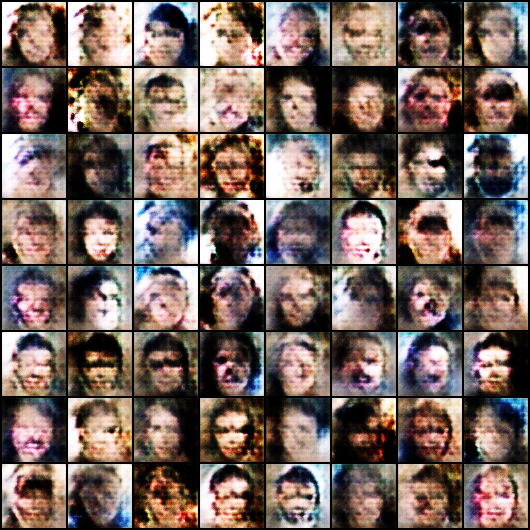

In [27]:
from IPython.display import Image
Image('./generated/generated-images-0060.png')

In [28]:
vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

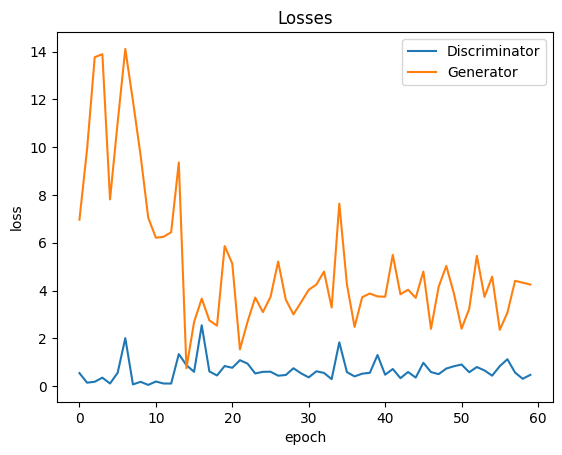

In [29]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

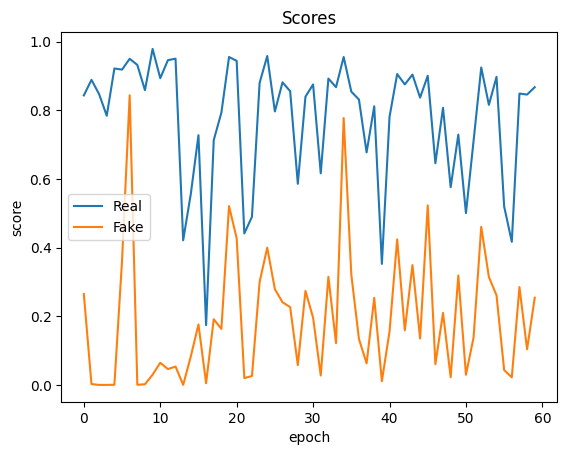

In [30]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');